In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp
import rubin_sim.maf as maf

In [2]:
families = maf.archive.get_family_descriptions('runs_v2.2.json')
family_list = families.index.values
summary_source = 'summary_2022_10_25.csv'
summaries = maf.get_metric_summaries(summary_source=summary_source)
metrics_source = 'metric_sets.json'
metric_sets = maf.get_metric_sets(metrics_source)

# list the metric sets
msets = list(metric_sets.groupby('metric set').first().index)

---
**draft v3** : Draft versions of simulations incorporating the SCOC Phase 2 recommendations for survey strategy.  
**version**: 2.99  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
draft_connected_v2.99_10yrs,"DDF at 7.5%, twilight NEO microsurvey, priority GP footprint.",1953.04,16988.14,2076864.0,792.0,46.0,63.0,173.0,177.0,152.0,158.0
roll_early_v2.99_10yrs,"Starting rolling early and increase suppress revisit weight. DDF at 7.5%, twilight NEO microsurvey, priority GP footprint.",1945.48,16893.30,2077239.0,792.0,45.0,64.0,173.0,177.0,152.0,158.0
dd6_v2.99_10yrs,"DDF at 5%, twilight NEO microsurvey, priority GP footprint.",5309.37,17109.84,2077797.0,810.0,46.0,65.0,177.0,180.0,155.0,162.0
low_gp_v2.99_10yrs,"DDF at 7.5%, twilight NEO microsurvey, priority GP footprint but low nvisits.",8264.52,17135.02,2077254.0,822.0,47.0,65.0,177.0,181.0,158.0,164.0


(0.8, 1.2)

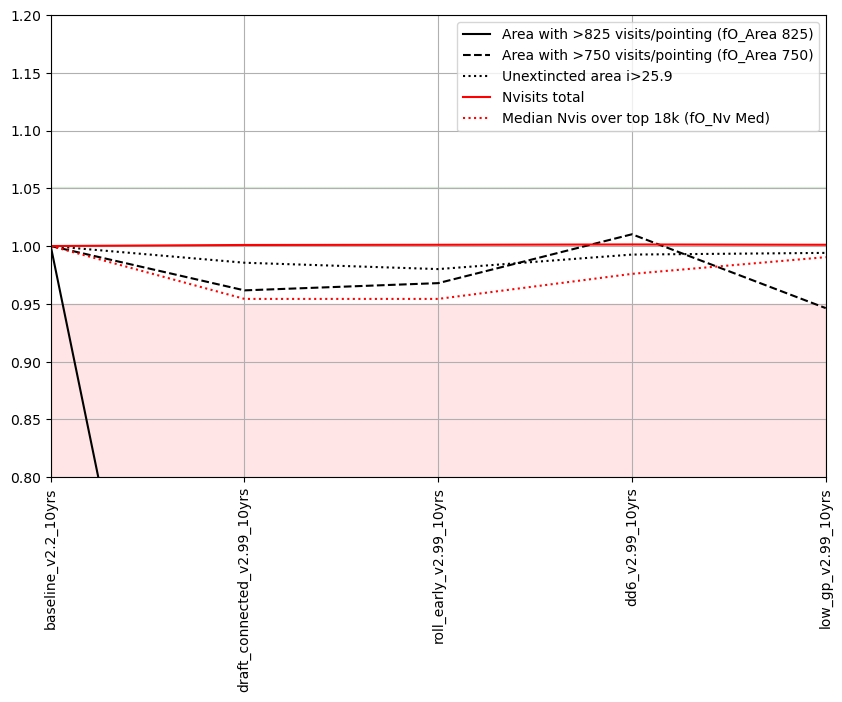

In [3]:
fig, ax = maf.archive.describe_families(
        families.loc[['draft v3'], :],
        summary=summaries,
        table_metric_set=metric_sets.loc["short description"],
        plot_metric_set=metric_sets.loc["plot areas"],
        baseline_run=families.loc['draft v3', "reference"],
    )
ax.set_ylim(0.8, 1.2)

In [4]:
ddir = os.getenv("OPSIM_DB_DIR")
if ddir is None:
    ddir = '/Users/lynnej/opsim'

draft_runs = list(families.explode('run').loc['draft v3', 'run'])

In [5]:
outDir = 'draft_temp'
nside=64
bundles = {}
t = families.explode(['run', 'filepath']).loc['draft v3', ['run', 'filepath']].set_index('run')
for r in draft_runs:
    opsdb = os.path.join(ddir, t.loc[r, 'filepath'])
    metric = maf.CountMetric(col='observationStartMJD', metricName='Nvisits')
    s = maf.HealpixSlicer(nside=nside)
    bundles[r] = maf.MetricBundle(metric, s, None, runName=r)
    g = maf.MetricBundleGroup({r: bundles[r]}, opsdb, outDir=outDir)
    g.runAll()

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


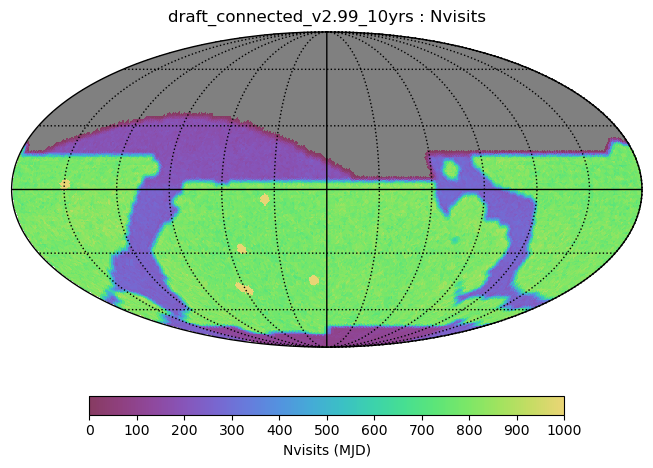

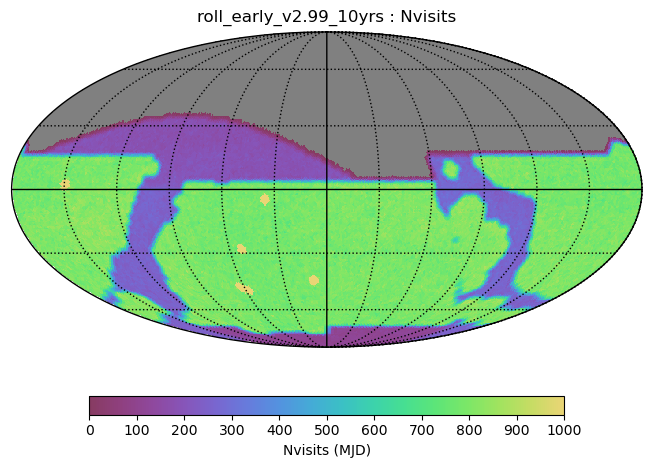

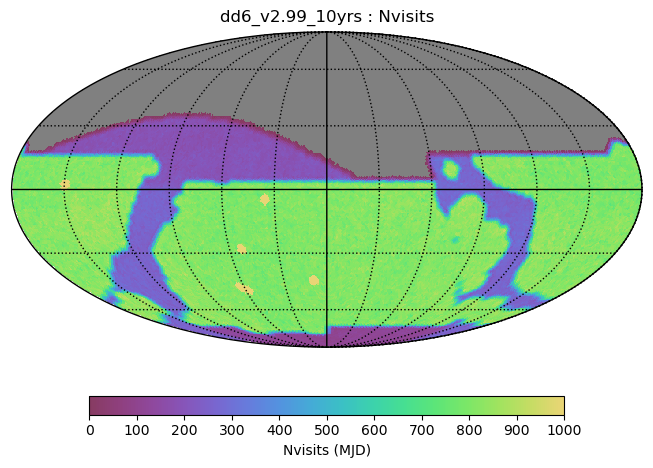

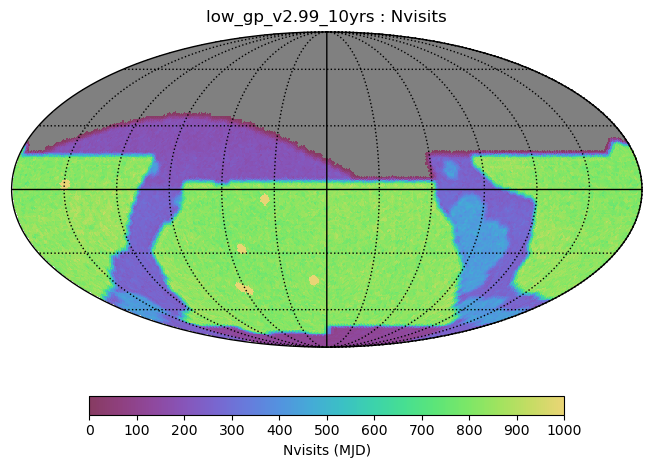

In [6]:
ph = maf.PlotHandler(outDir=outDir, thumbnail=False, figformat='png')
for r in draft_runs:
    plotDict = {'colorMin': 0, 'colorMax': 1000}
    ph.setMetricBundles([bundles[r]])
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotDict)

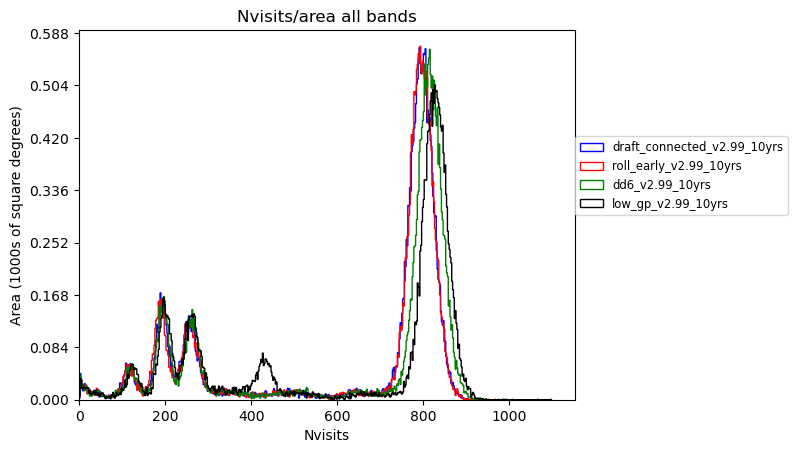

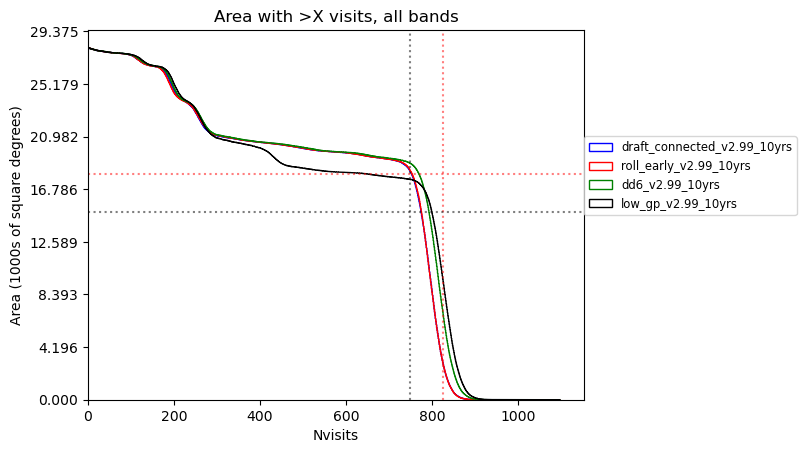

In [7]:
# Area / Nvisits 

draft_colors = dict(zip(draft_runs, ['b', 'r', 'g', 'k']))

plotDicts = []
for r in draft_runs:
    plotDicts.append({'color': draft_colors[r], 
                      'xMin': 0,
                      'bins':np.arange(0, 1100, 2),
                     'legendloc': (1.0, 0.5),
                     'title': "Nvisits/area all bands"})
ph.setMetricBundles(bundles)
ph.plot(maf.HealpixHistogram(), plotDicts=plotDicts)


plotDicts = []
plotDicts = []
for r in draft_runs:
    plotDicts.append({'color': draft_colors[r], 
                      'xMin': 0,
                      'cumulative': -1,
                      'bins':np.arange(0, 1100, 1),
                     'legendloc': (1.0, 0.5),
                     'title': "Area with >X visits, all bands"})
ph.setMetricBundles(bundles)
ph.plot(maf.HealpixHistogram(), plotDicts=plotDicts)
plt.axvline(750, color='k', linestyle=':', alpha=0.5)
plt.axvline(825, color='r', linestyle=':', alpha=0.5)
yscale = hp.nside2pixarea(s.nside, degrees=True) / 1000.0
plt.axhline(18/yscale, color='r', linestyle=':', alpha=0.5)
plt.axhline(15/yscale, color='k', linestyle=':', alpha=0.5)

In [8]:
# Pull down target footprint information
import requests
rooturl = 'https://raw.githubusercontent.com/lsst-sims/sims_featureScheduler_runs3.0/main/draft/'
for file in ['draft_connected.py', 'make_ddf_survey.py', 'gen_long_gaps.py']:
    r = requests.get(rooturl+file, allow_redirects=True)
    with open(file, 'w') as f:
        f.write(r.content.decode())
    
from draft_connected import Sky_area_generator_galplane
sky = Sky_area_generator_galplane(nside=nside, smc_radius=4, lmc_radius=6)
footprints, labels = sky.return_maps(
    bulge_ratios={"u": 0.23, "g": 0.43, "r": 1.22, "i": 1.17, "z": 0.82, "y": 0.65},
    dusty_plane_ratios={
        "u": 0.08,
        "g": 0.12,
        "r": 0.31,
        "i": 0.31,
        "z": 0.28,
        "y": 0.22,
    },
)

total_fp = np.zeros(len(footprints['r']))
for f in 'ugrizy':
    total_fp += footprints[f]
#hp.mollview(total_fp)
np.unique(labels)

array(['', 'LMC_SMC', 'bulgy', 'dusty_plane', 'lowdust', 'nes', 'scp',
       'virgo'], dtype='<U20')

In [9]:
# Count median visits in each of these regions within the footprint
median_nvisits = {}
for r in draft_runs:
    median_nvisits[r] = {}
    for l in np.unique(labels):
        median_nvisits[r][l] = np.median(bundles[r].metricValues.filled(0)[np.where(labels == l)])
pd.DataFrame(median_nvisits)

,draft_connected_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs
,0.0,0.0,0.0,0.0
LMC_SMC,786.0,788.0,807.0,817.0
bulgy,809.0,813.0,830.0,429.0
dusty_plane,266.0,268.0,272.0,269.0
lowdust,795.0,794.0,813.0,828.0
nes,195.0,191.0,197.0,202.0
scp,121.0,121.0,125.0,130.0
virgo,765.0,773.0,798.0,813.0


In [11]:
import sqlite3
specials = ['twilight_neo', 'long']
count = {}
for r in draft_runs:
    count[r] = {}
    opsdb = os.path.join(ddir, t.loc[r, 'filepath'])
    conn = sqlite3.connect(opsdb)
    cursor = conn.cursor()
    for s in specials:
        query = f'select count(*) from observations where note like "%{s}%"'
        results = cursor.execute(query).fetchall()
        count[r][s] = int(results[0][0])
    conn.close()

pd.concat([pd.DataFrame(count), 
           summaries.loc[draft_runs, ['Nvisits DDF', 'Nvisits WFD', 'Nvisits All visits']].T])

,draft_connected_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs
twilight_neo,18861.0,18529.0,18591.0,18182.0
long,90116.0,90075.0,94084.0,90276.0
Nvisits DDF,150590.0,150689.0,107076.0,150535.0
Nvisits WFD,1662976.0,1664976.0,1712919.0,1611317.0
Nvisits All visits,2076864.0,2077239.0,2077797.0,2077254.0


In [12]:
# Time in DDFs
these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

pd.DataFrame(summaries.loc[these_runs, 'Nvisits DDF']/summaries.loc[these_runs, 'Nvisits All visits'],
            columns=['Fraction DDF']).round(3)

,Fraction DDF
run,
baseline_v2.0_10yrs,0.045
baseline_v2.1_10yrs,0.045
baseline_v2.2_10yrs,0.050
draft_connected_v2.99_10yrs,0.073
roll_early_v2.99_10yrs,0.073
dd6_v2.99_10yrs,0.052
low_gp_v2.99_10yrs,0.072


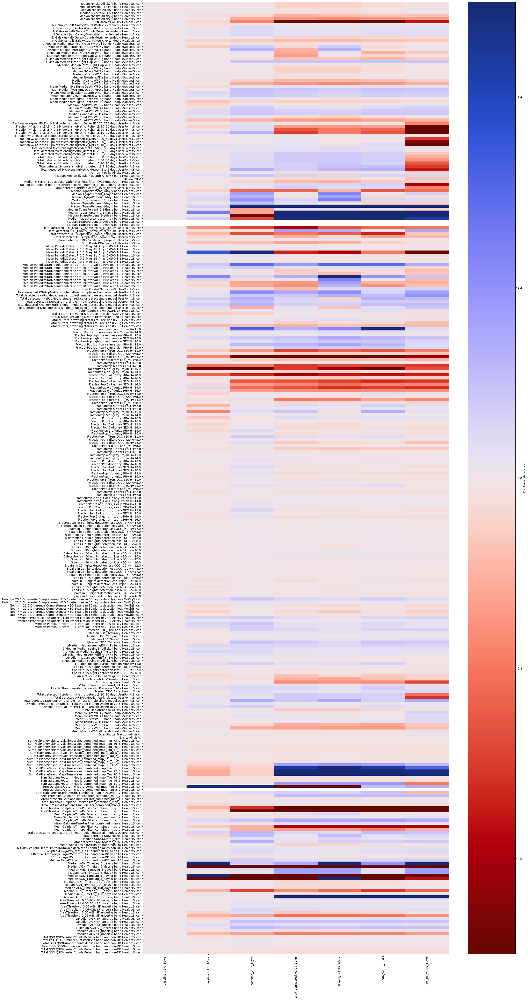

In [13]:
baseline_run = 'baseline_v2.0_10yrs'

these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

# We can plot them all together, but need to remove duplicates
non_dd = [m for m in msets if 'DD' not in m]
msub = metric_sets.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False, verify_integrity=True)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
fig.set_figwidth(24)
fig.set_figheight(60)

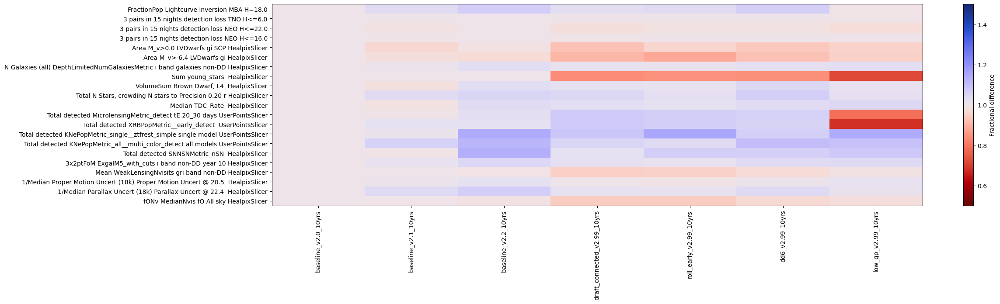

In [14]:
msub = metric_sets.loc['SCOC']
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
fig.set_figwidth(24)

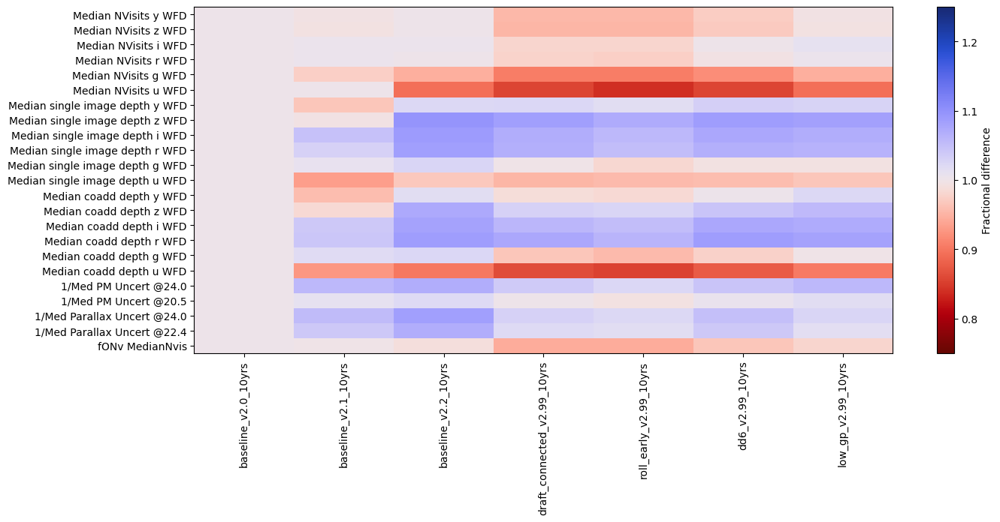

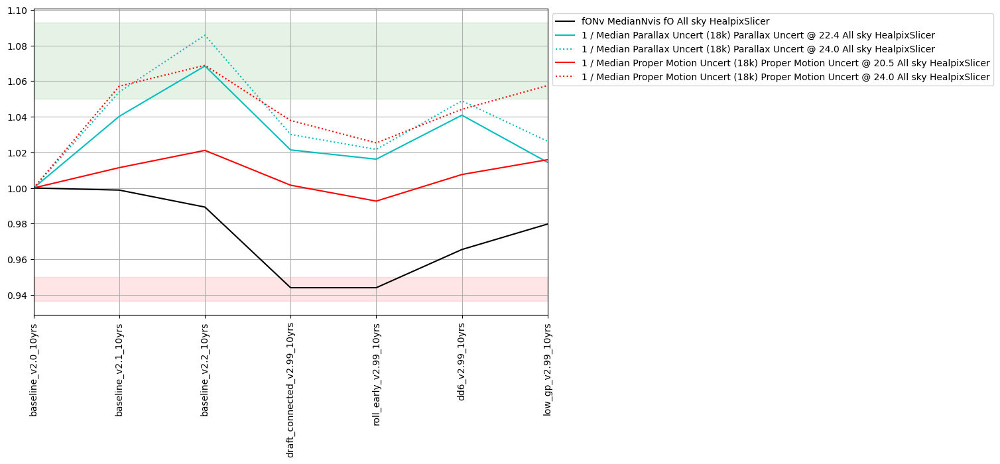

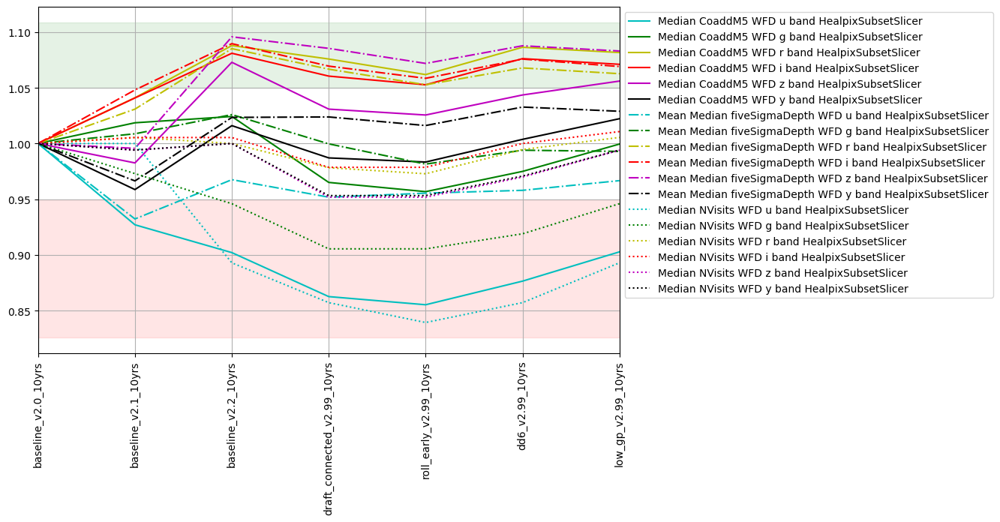

In [15]:
# Very basic metrics 

msub = metric_sets.loc[['SRD', 'WFD Depths']].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)

msub = metric_sets.loc['SRD']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')

msub = metric_sets.loc['WFD Depths']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')

In [16]:
msubm = list(metric_sets.loc['WFD Depths'].query('metric.str.contains("NVisits")', 
                                                 engine='python')['metric'].values)
msubm.append('Median NVisits WFD all bands HealpixSubsetSlicer')
summaries.loc[these_runs, msubm]

metric,Median NVisits WFD u band HealpixSubsetSlicer,Median NVisits WFD g band HealpixSubsetSlicer,Median NVisits WFD r band HealpixSubsetSlicer,Median NVisits WFD i band HealpixSubsetSlicer,Median NVisits WFD z band HealpixSubsetSlicer,Median NVisits WFD y band HealpixSubsetSlicer,Median NVisits WFD all bands HealpixSubsetSlicer
run,,,,,,,
baseline_v2.0_10yrs,56.0,74.0,184.0,187.0,166.0,171.0,838.0
baseline_v2.1_10yrs,56.0,72.0,185.0,188.0,165.0,170.0,837.0
baseline_v2.2_10yrs,50.0,70.0,184.0,188.0,166.0,171.0,829.0
draft_connected_v2.99_10yrs,48.0,67.0,180.0,183.0,158.0,163.0,799.0
roll_early_v2.99_10yrs,47.0,67.0,179.0,183.0,158.0,163.0,798.0
dd6_v2.99_10yrs,48.0,68.0,183.0,187.0,161.0,166.0,815.0
low_gp_v2.99_10yrs,50.0,70.0,185.0,189.0,165.0,170.0,828.0


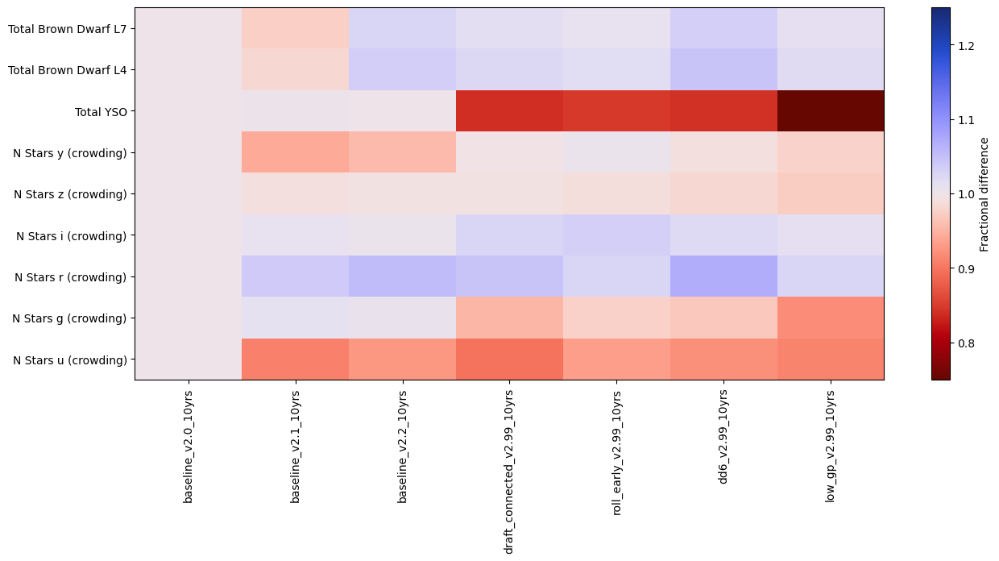

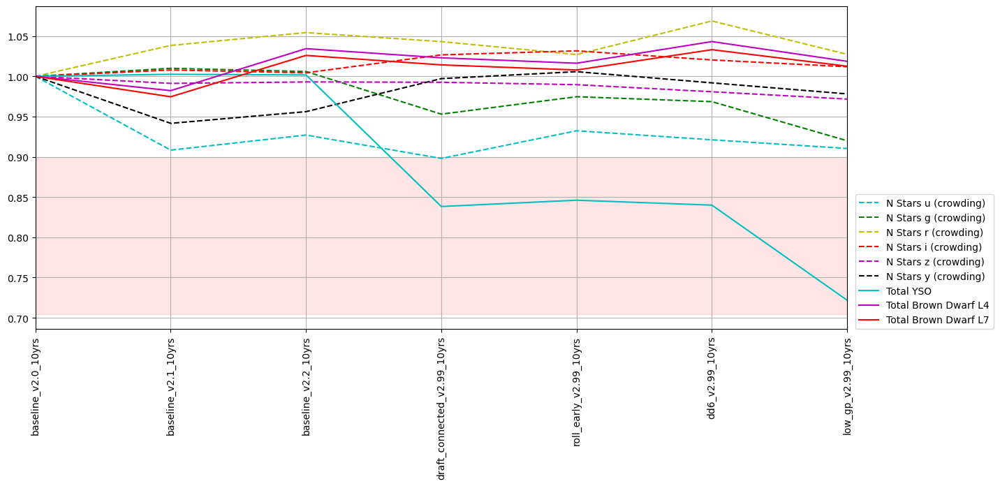

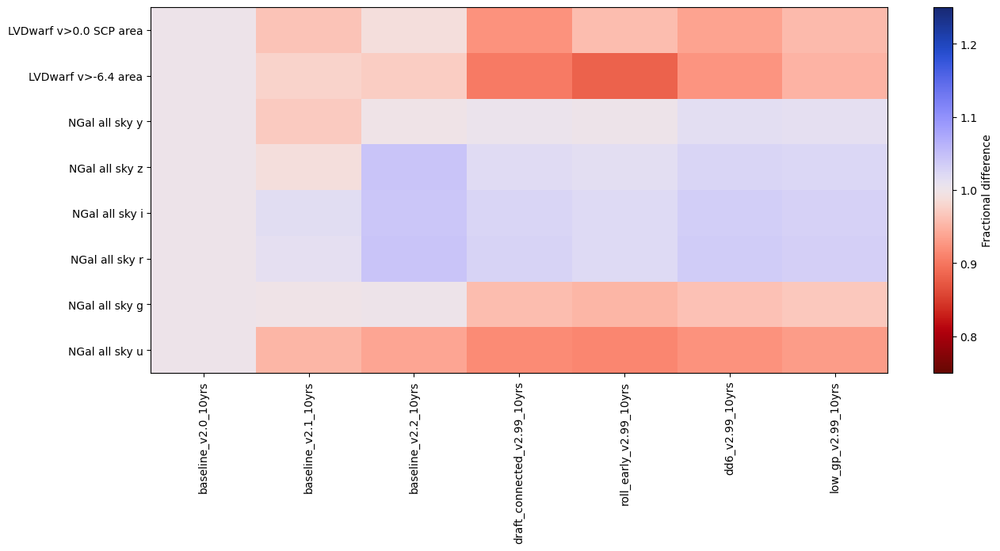

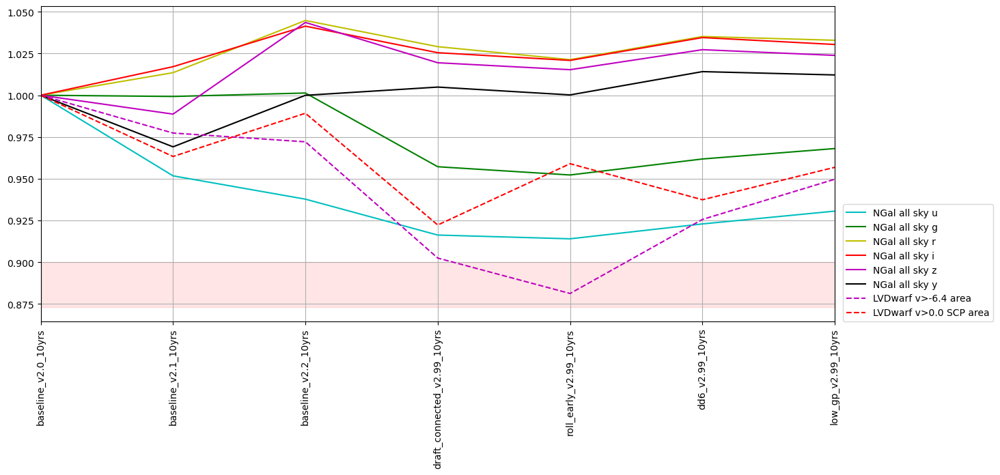

In [17]:
# Stars and Galaxy counts metrics
k_sets = ['Stars', 'galaxies']
for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(2, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

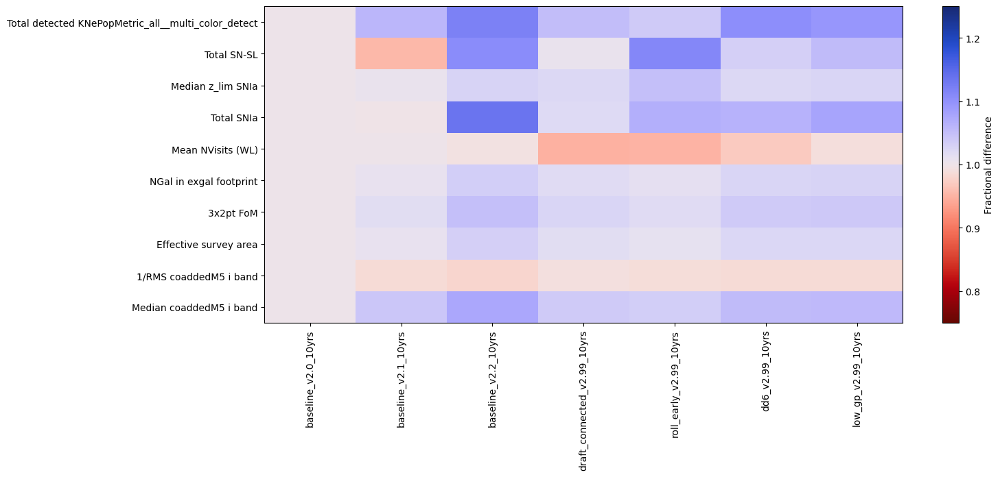

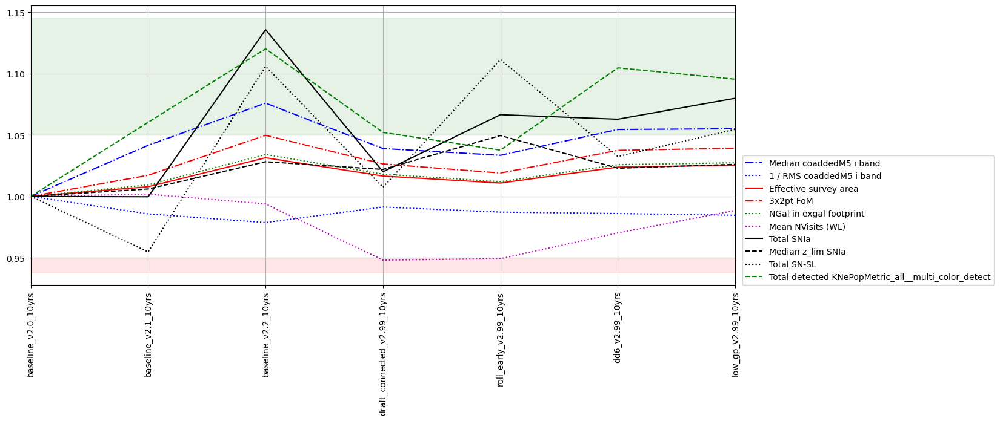

In [18]:
# DESC metrics
k_sets = [k for k in msets if k.startswith('DESC') and not k.endswith('DDF')]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


SSO discovery
SSO lightcurve inversion


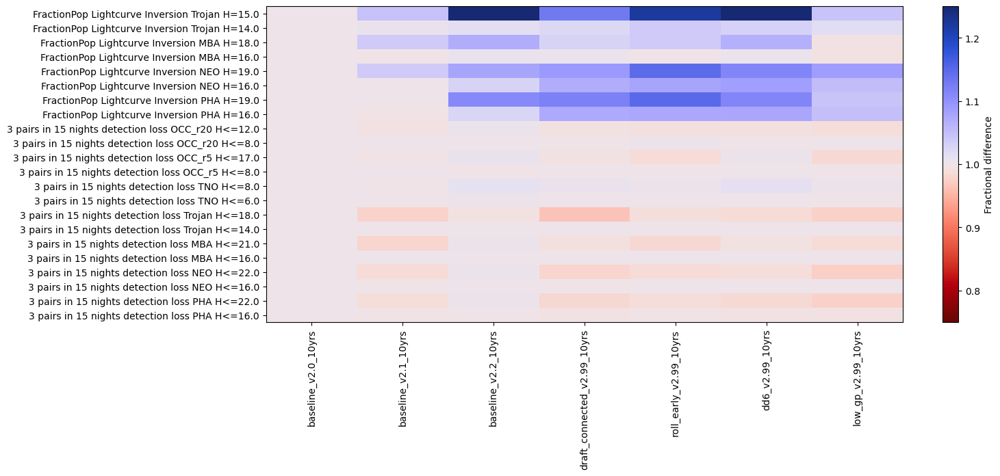

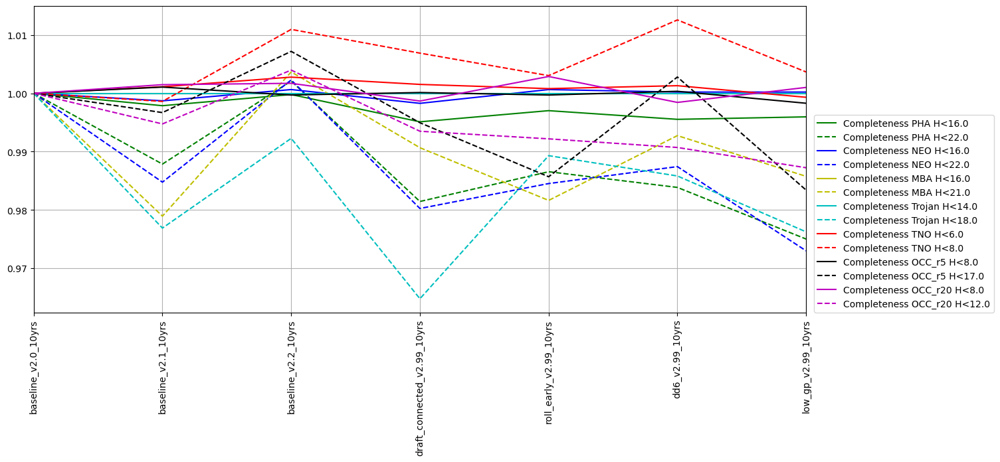

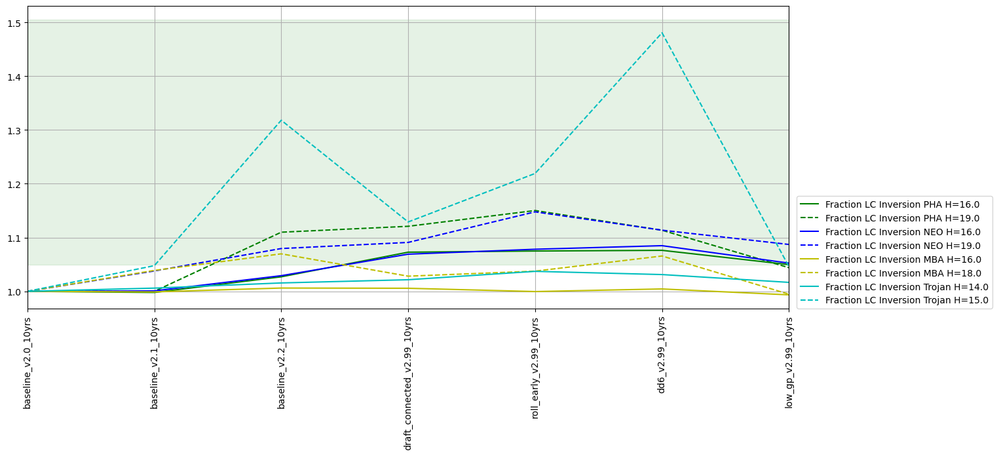

In [19]:
# sso metrics
k_sets = ['SSO discovery', 'SSO lightcurve inversion']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)


for k in k_sets:
    print(k)
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/runComparison/summary_plots.py:326: UserWarning: There are infinite values in the plot of Median TgapsPercent_2-14hrs u band.
  warnings.warn(f"There are infinite values in the plot of {idx}.")


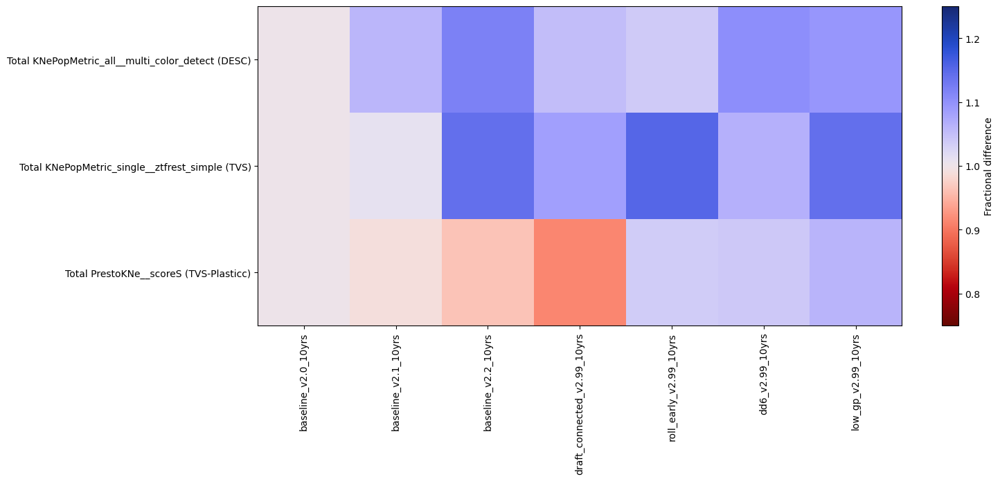

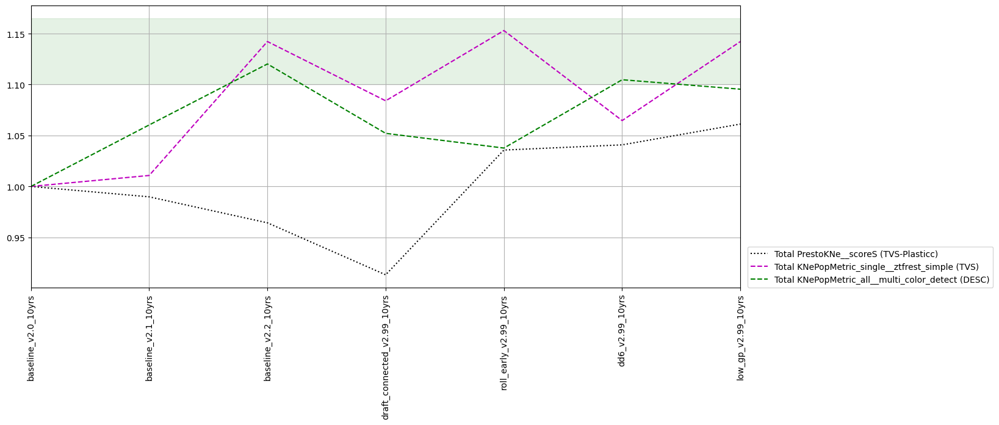

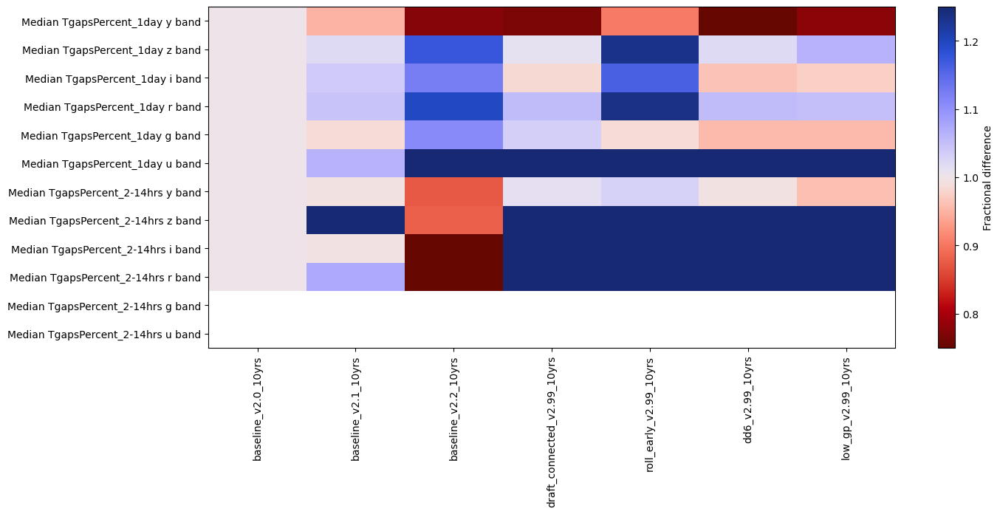

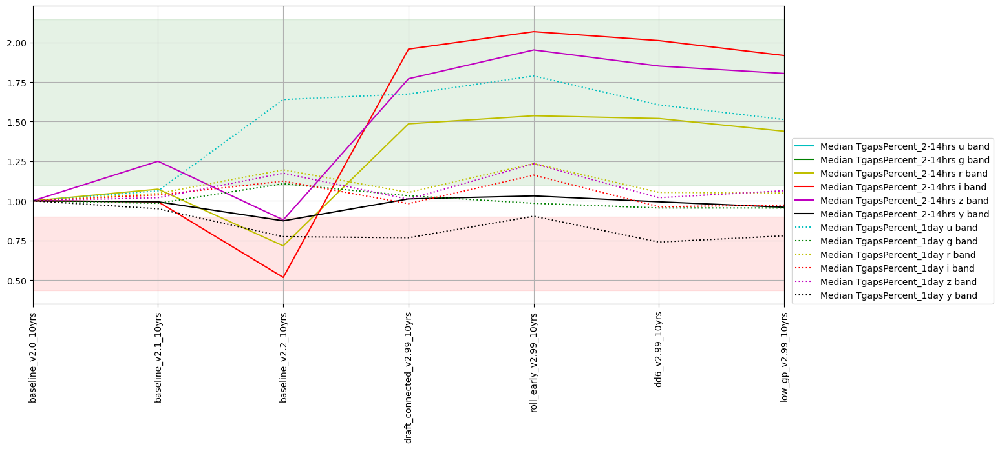

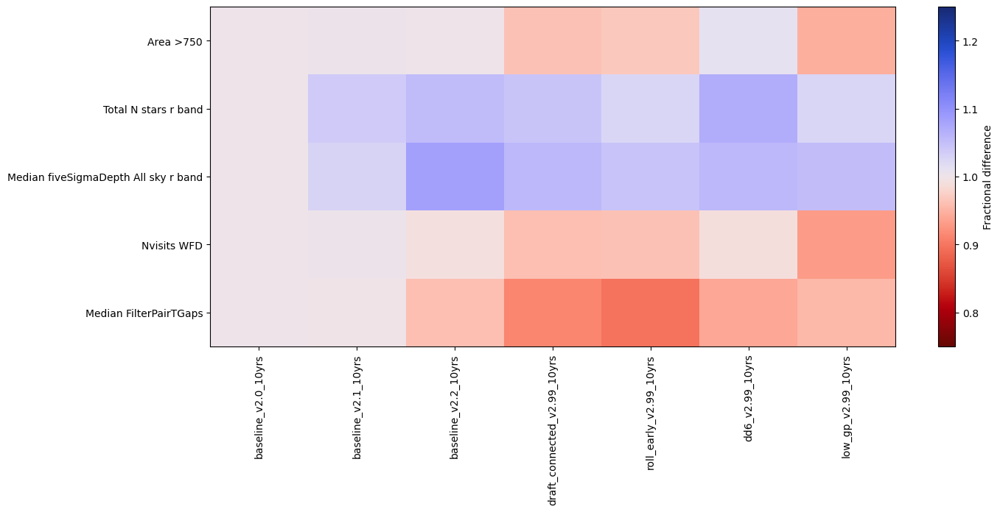

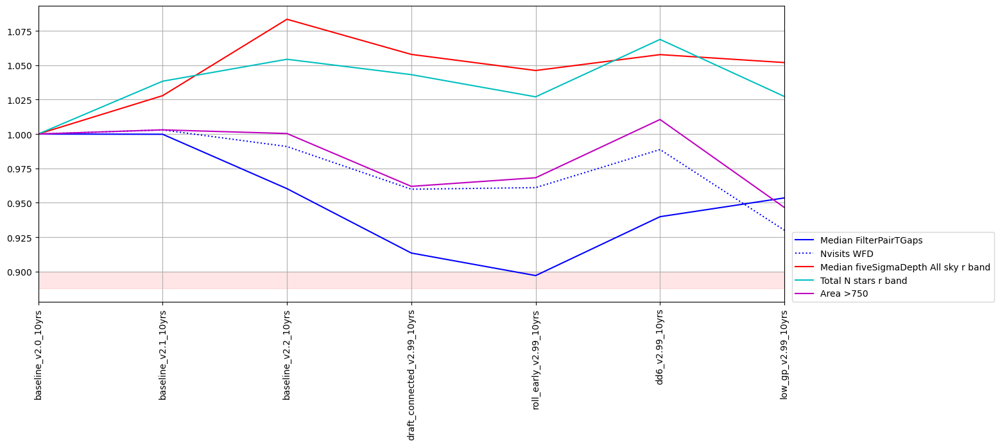

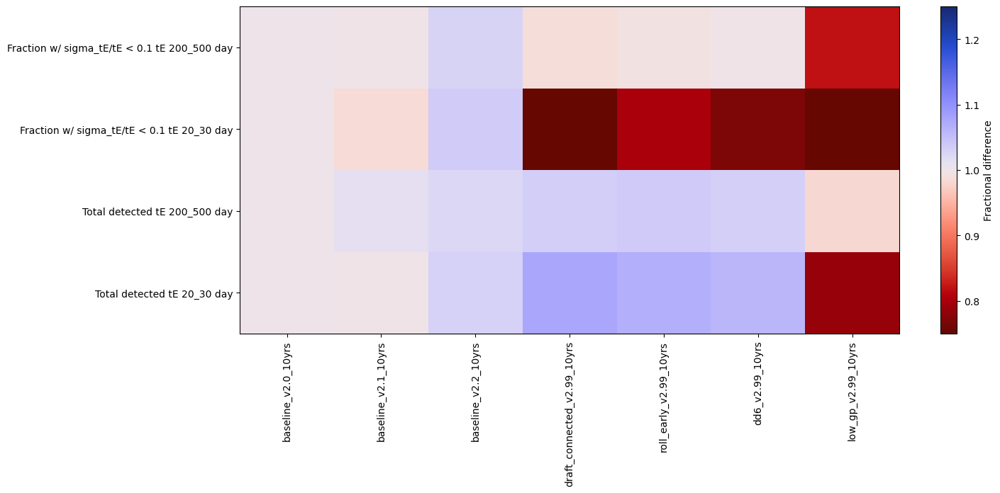

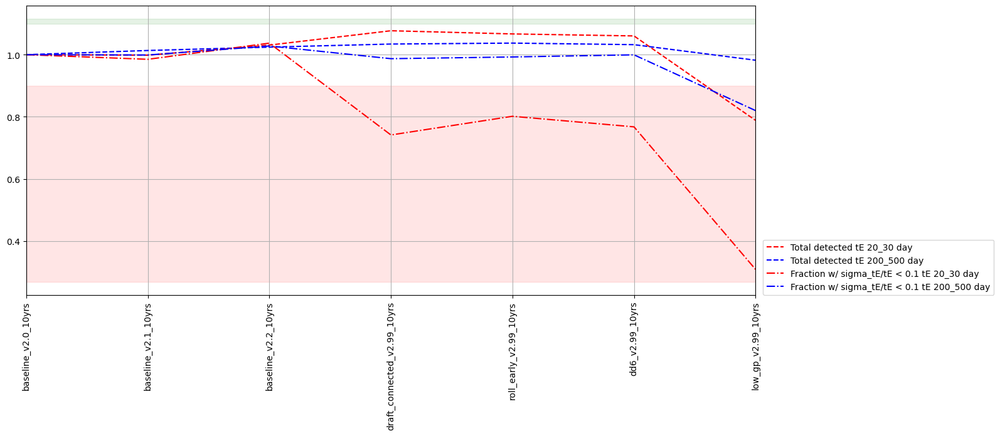

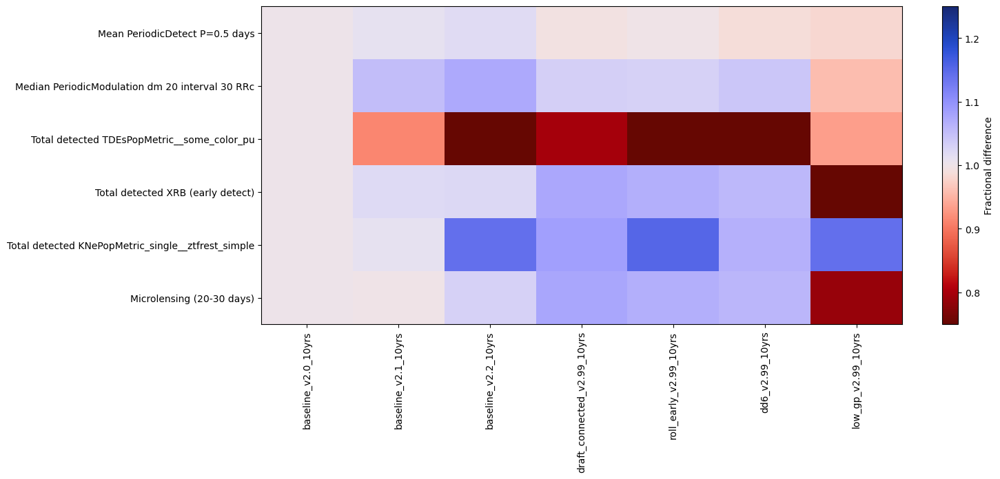

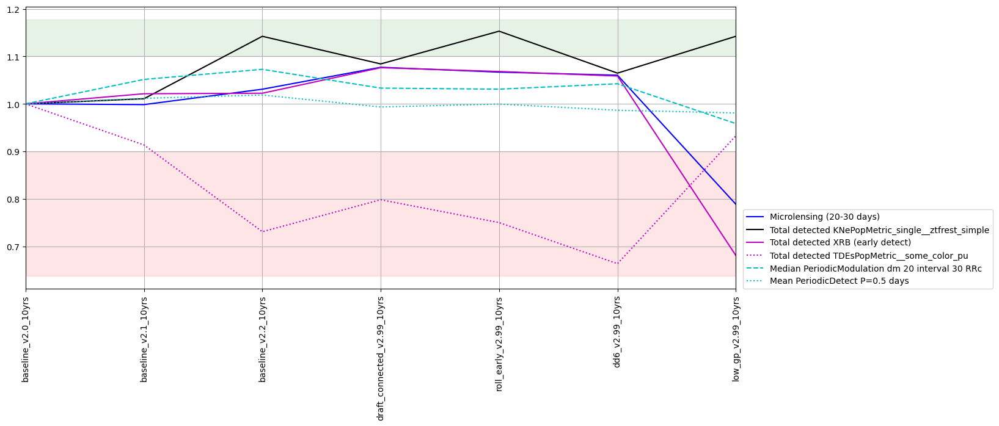

In [20]:
# TVS metrics
k_sets = [k for k in msets if k.startswith('TVS') and (k.endswith('short') or ('Tgaps' in k) or ('anomalies' in k)) ]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(3, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


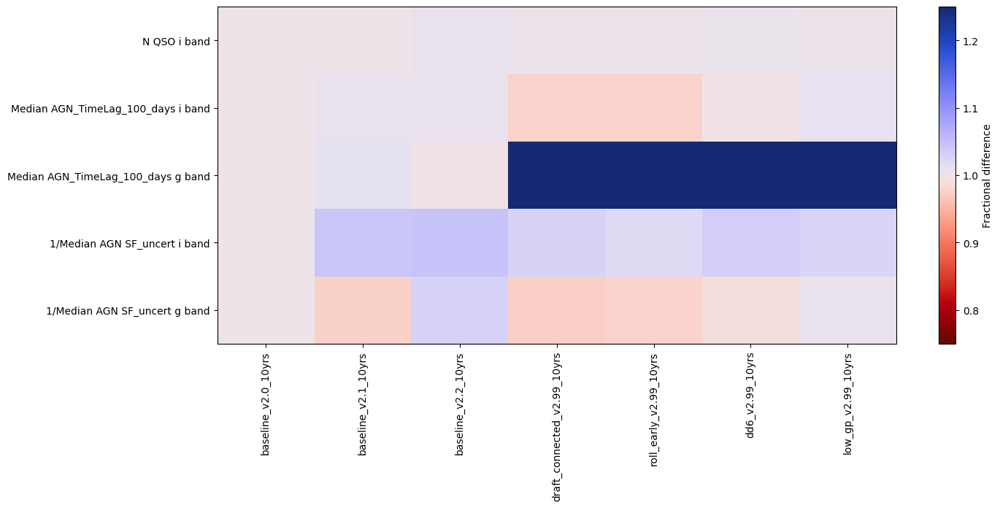

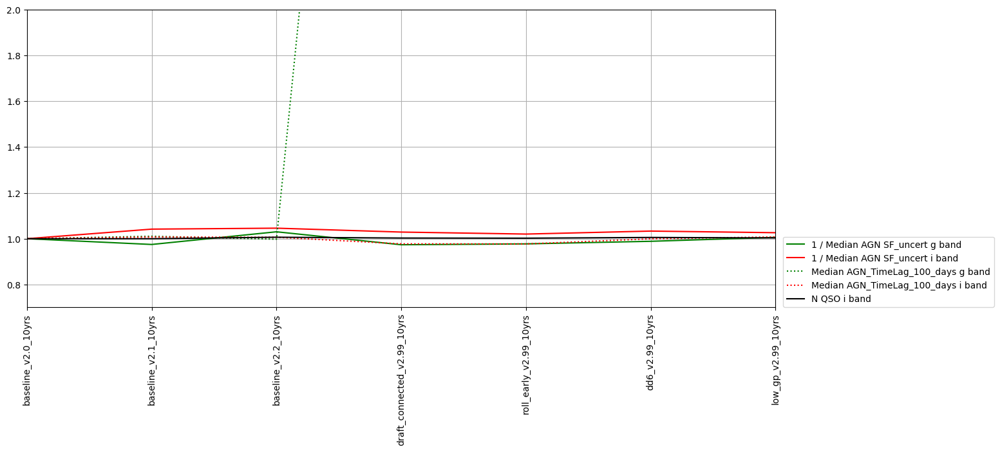

In [21]:
k = 'AGN short'
# AGN metrics
k_sets = ['AGN short']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)


for k in k_sets:
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=0)
    ylims = ax.get_ylim()
    ax.set_ylim(max(0.2, ylims[0]), min(2, ylims[1]))
    fig.set_figwidth(15)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

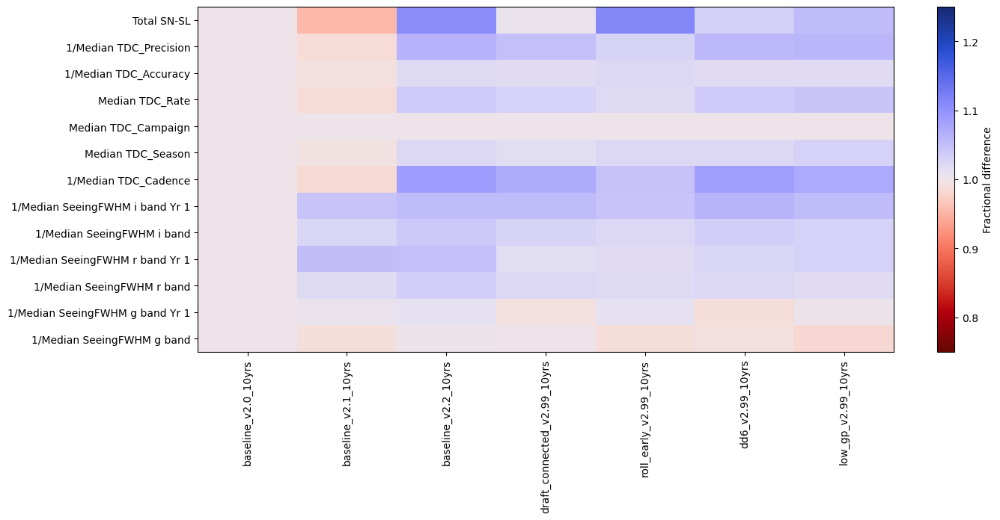

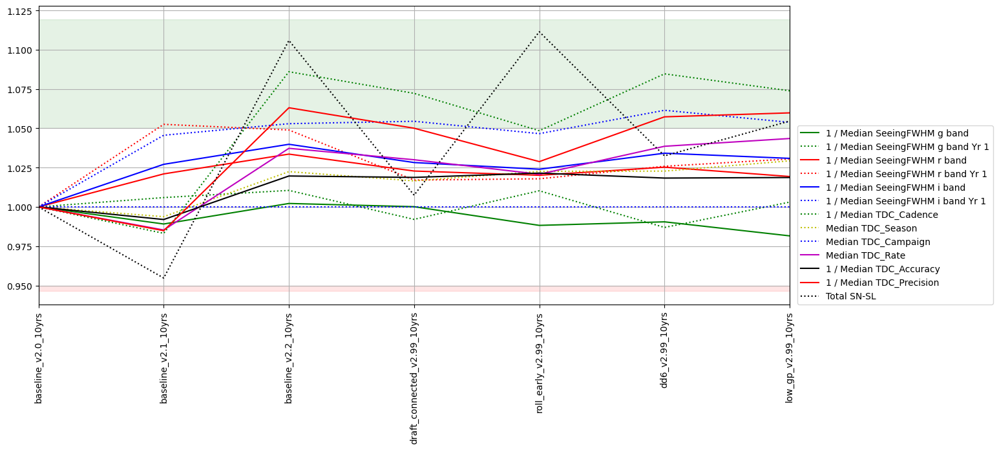

In [22]:
# StrongLensing metrics

k_sets = [k for k in msets if k.startswith('SL')]

msub = metric_sets.loc[k_sets].reset_index('metric set')
# Add the strong lensed supernova metric
msub = pd.concat([msub, 
                  metric_sets.loc['DESC WFD'].query('metric.str.contains("SNSL")', engine='python')])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)



fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']], 
                              baseline_run=baseline_run,
                              metric_set=msub,
                              metric_label_map=msub['short_name'],
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(15)
#ax.set_ylim(0.5, 1.5)
lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


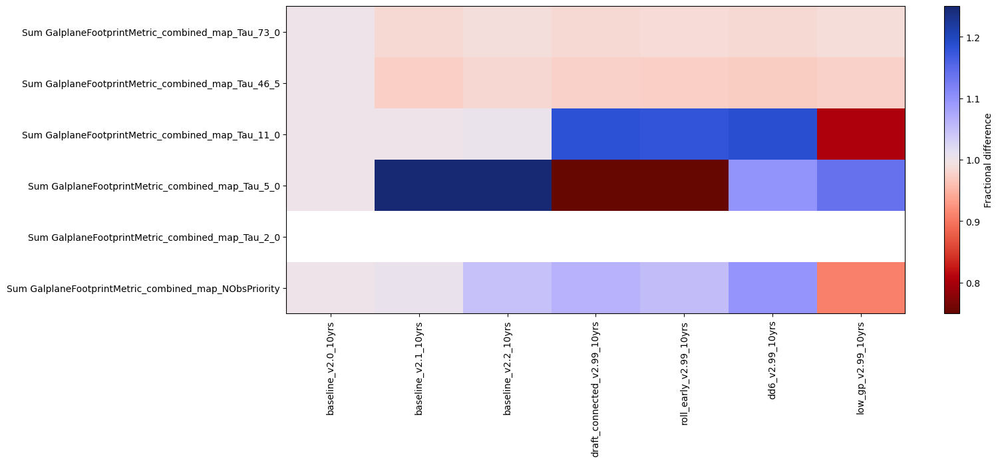

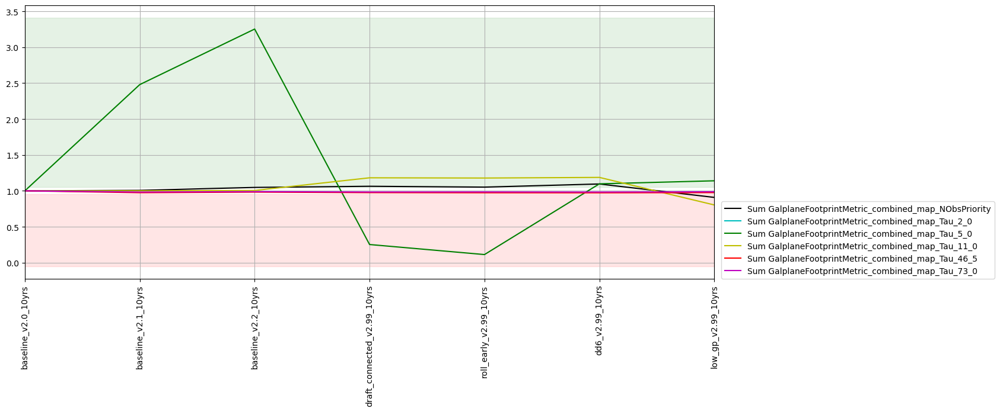

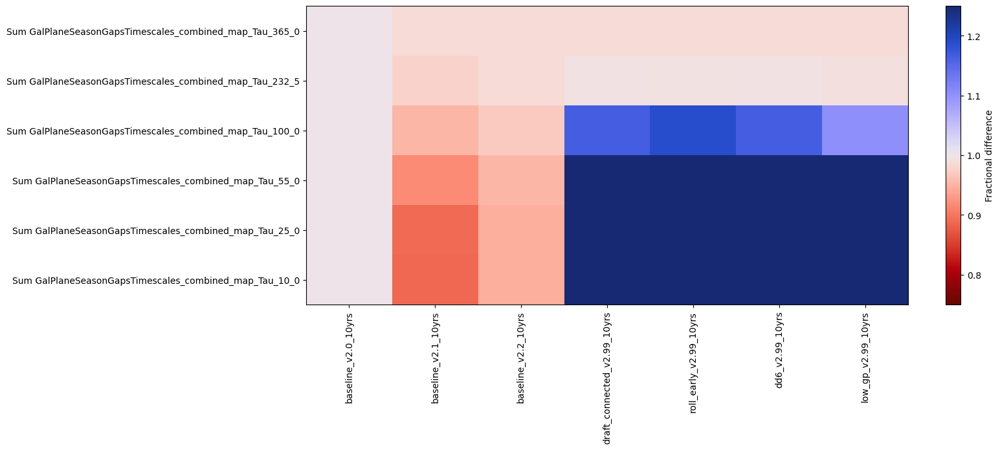

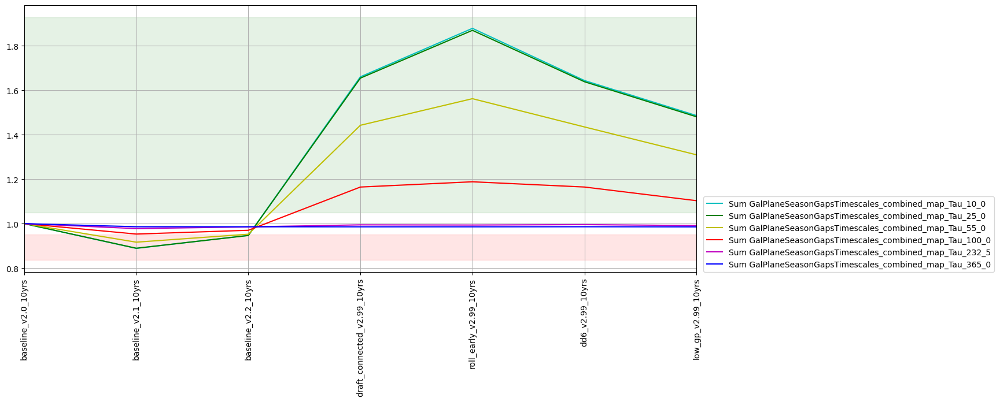

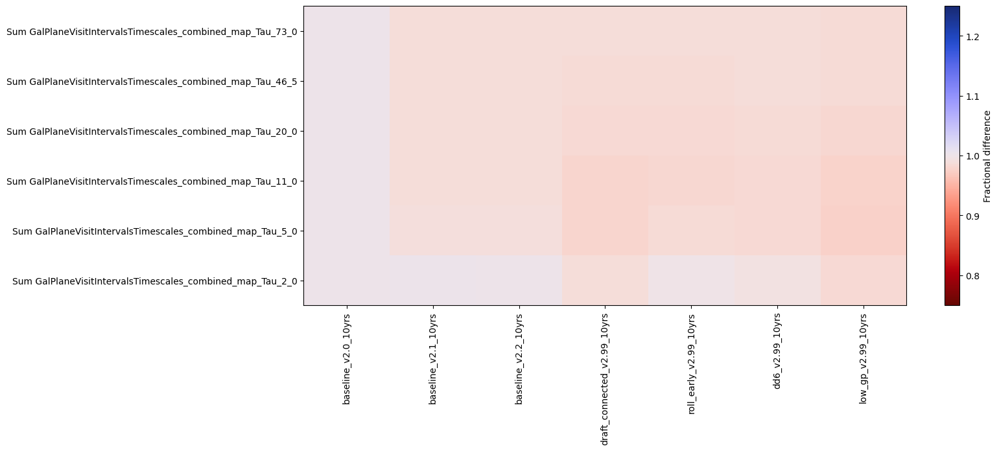

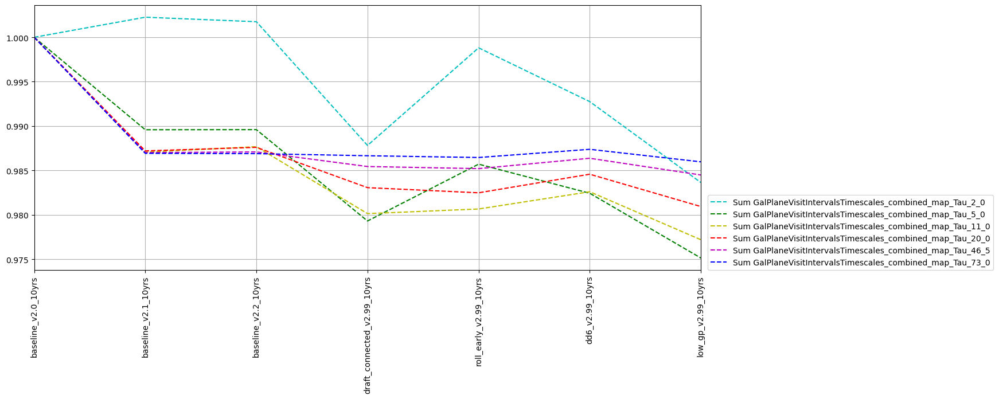

In [23]:
# GP footprint metrics
k_sets = [k for k in msets if k.startswith('GP') and 'filter' not in k]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


Some of the trades above are due to DDF increases in time and adding the twilight NEO microsurvey, so let's check those benefits. 
(there are also trades due to changing the intranight cadence with triplets, but those should be reflected in the other metrics above, and likewise for the galactic plane footprint).

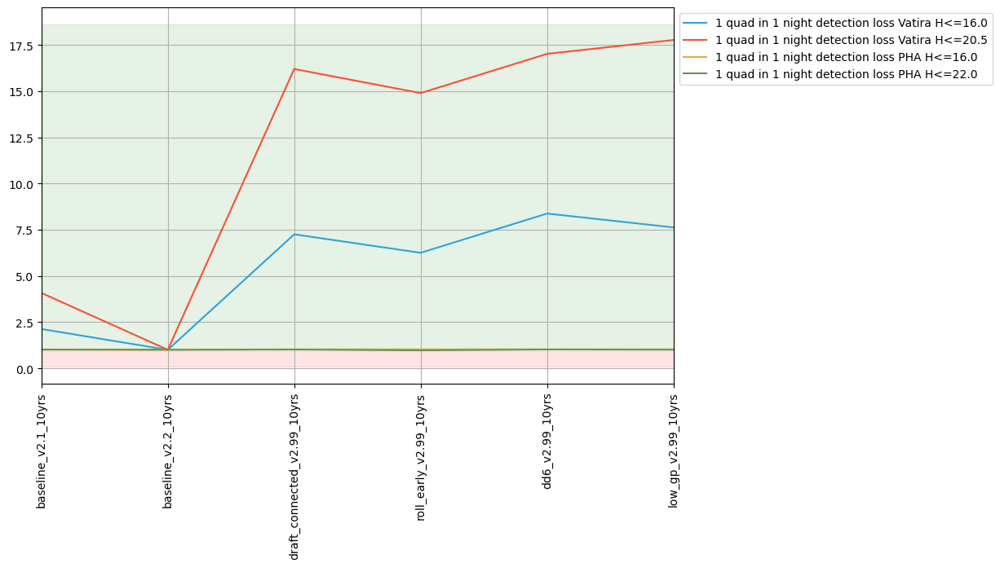

In [24]:
# microsurvey - vatira 
micro_discovery = [m for m in summaries if 'Vatira' in m and '1 quad in 1 night' in m ]
micro_discovery += [m for m in summaries if "PHA" in m and '1 quad in 1 night' in m and 'Nobj' not in m]

fig, ax = maf.plot_run_metric(summaries.loc[these_runs, micro_discovery].dropna(),
                            baseline_run='baseline_v2.2_10yrs',
                              linestyles=['-'],
                              markers=[''],
                             horizontal_quantity='run',
                             vertical_quantity='value')


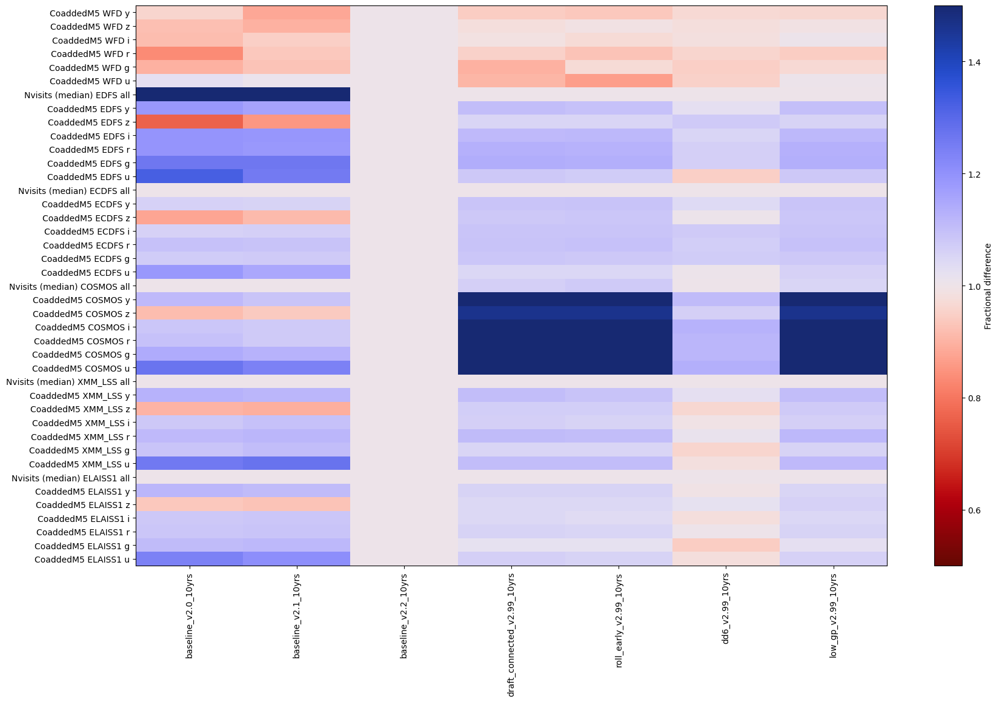

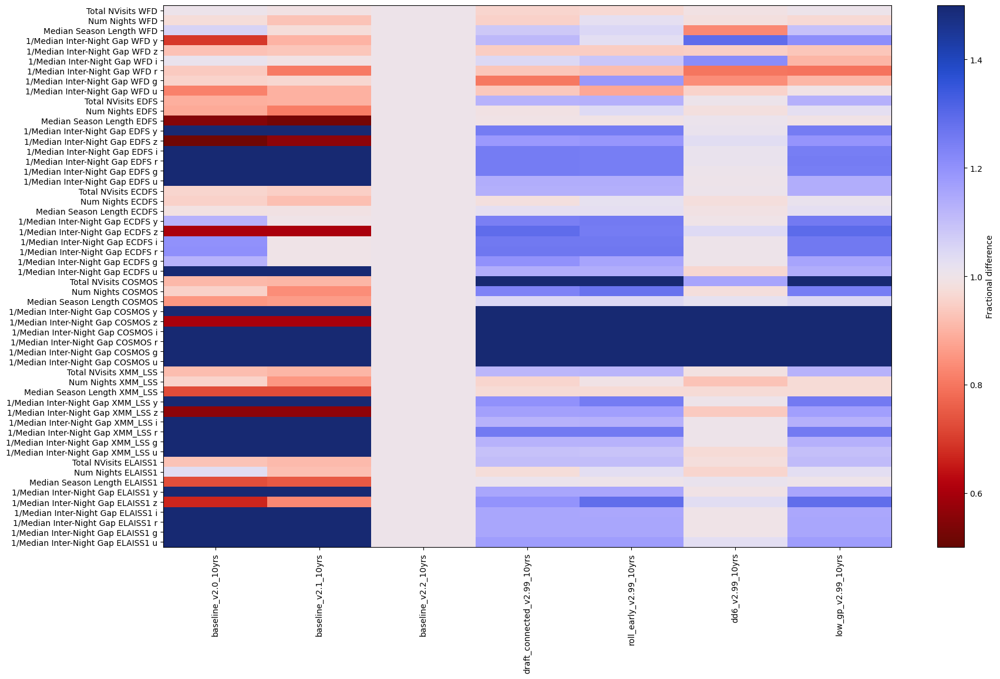

In [25]:
# DDF -- compare to v2.2 as this was the first version with pre-scheduled DDFs (v2.0/v2.1 are "non-prescheduled")
baseline = 'baseline_v2.2_10yrs'

for m in ['DDF Depths', 'DDF Cadence']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)


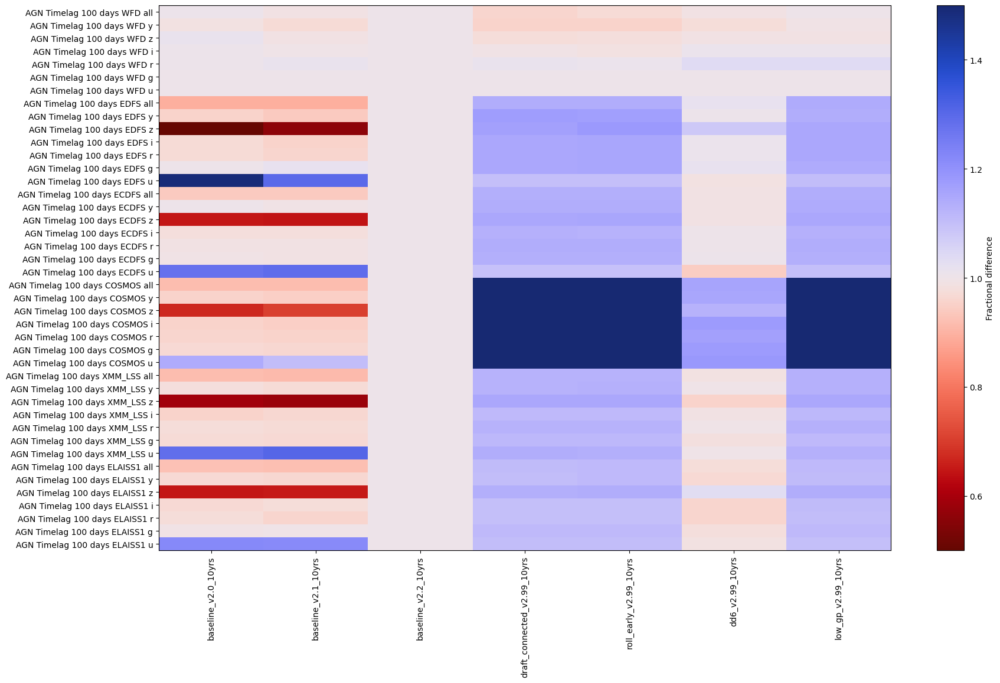

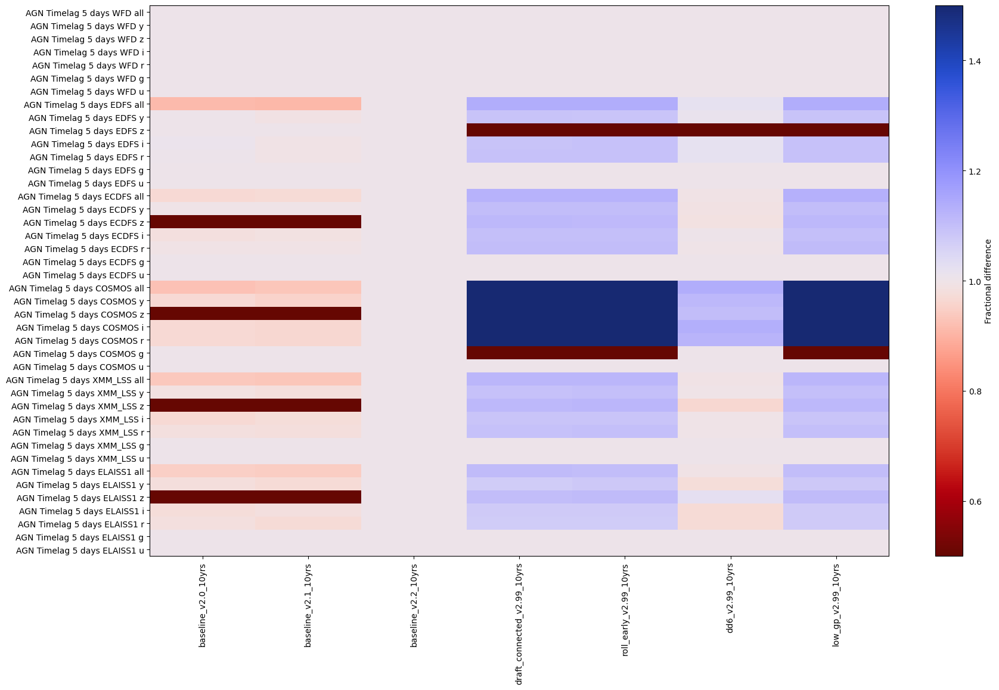

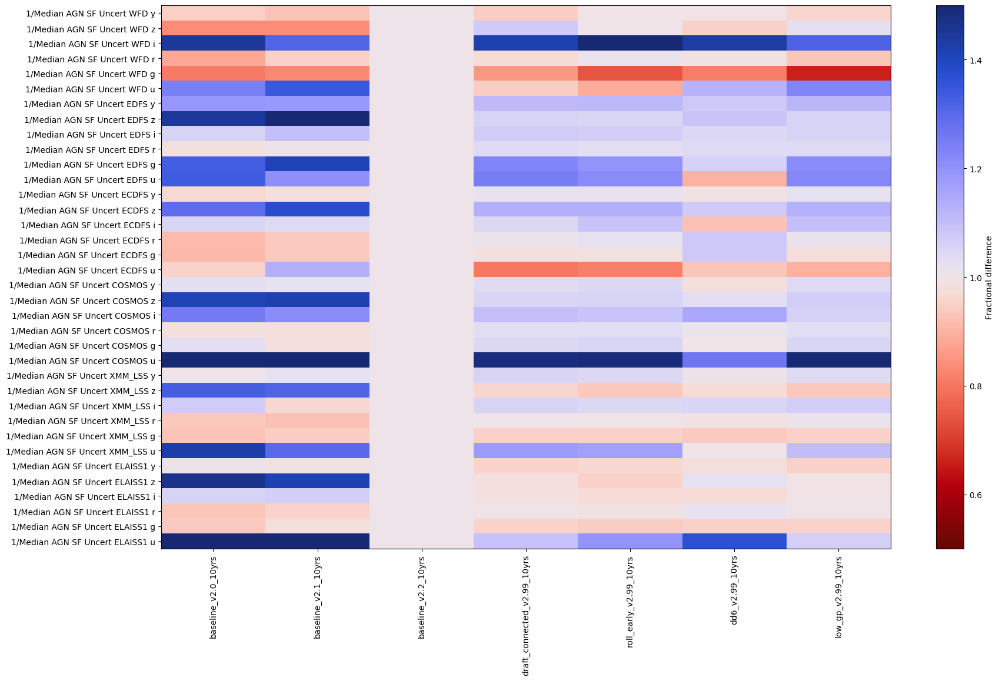

In [26]:
for m in ['AGN TimeLag 100 days DDF', 'AGN TimeLag 5 days DDF', 
          'AGN SF DDF']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)

metric,Sum SNNSNMetric DD:ELAISS1_nSN DD:ELAISS1 all bands HealpixSubsetSlicer,Sum SNNSNMetric DD:XMM_LSS_nSN DD:XMM_LSS all bands HealpixSubsetSlicer,Sum SNNSNMetric DD:COSMOS_nSN DD:COSMOS all bands HealpixSubsetSlicer,Sum SNNSNMetric DD:ECDFS_nSN DD:ECDFS all bands HealpixSubsetSlicer,Sum SNNSNMetric DD:EDFS_nSN DD:EDFS all bands HealpixSubsetSlicer,Sum SNNSNMetric DD:WFD_nSN DD:WFD all bands HealpixSubsetSlicer
run,,,,,,
baseline_v2.0_10yrs,81.438800,NaN,47.333916,5.217382,NaN,63.572320
baseline_v2.1_10yrs,40.212476,NaN,21.899369,2.592571,NaN,64.241074
baseline_v2.2_10yrs,3.753806,NaN,13.647867,6.881372,NaN,81.805931
draft_connected_v2.99_10yrs,34.299888,63.298867,497.970116,73.076811,80.740250,73.450311
roll_early_v2.99_10yrs,41.184944,61.453694,497.313768,75.258332,94.509930,90.195352
dd6_v2.99_10yrs,NaN,1.052239,252.615955,12.361395,NaN,69.197325
low_gp_v2.99_10yrs,41.570874,62.205360,497.514597,70.149076,78.520764,74.145469


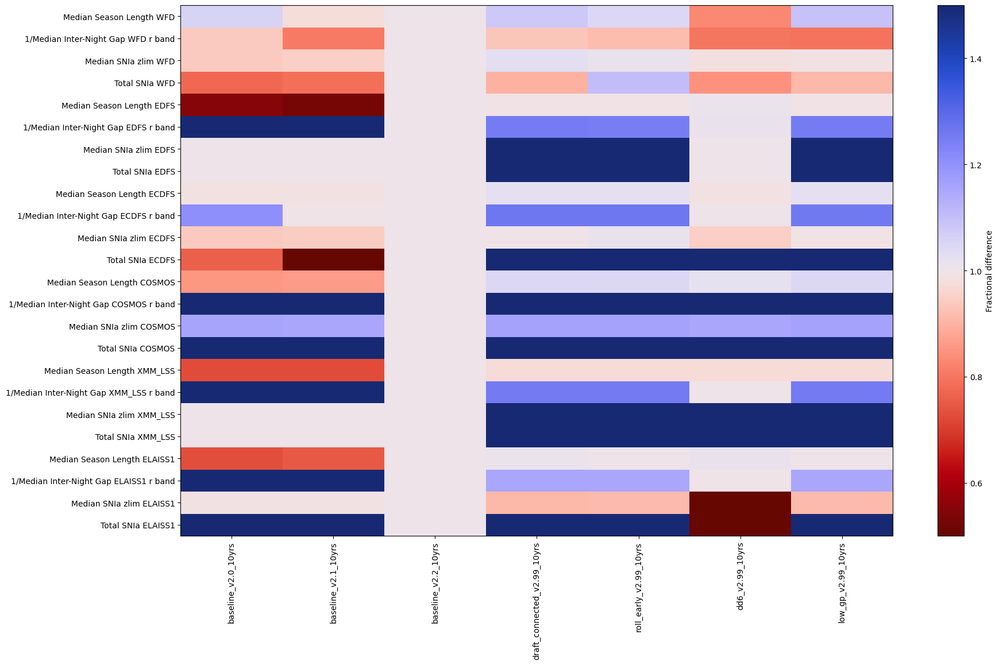

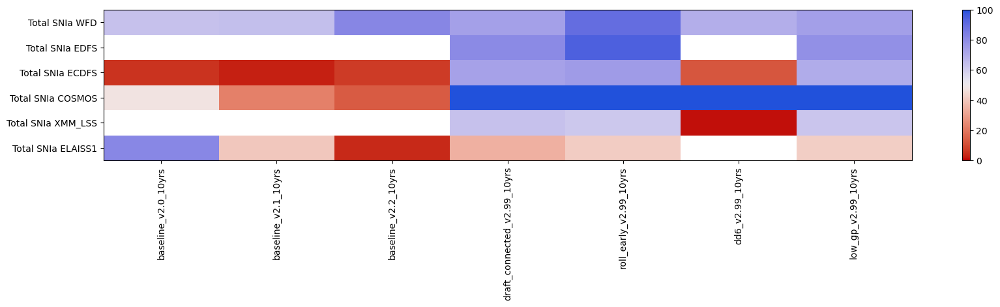

In [27]:
m = 'SNIa DDF'

metrics = metric_sets.loc[m]
# the SN summary values default to -1.6e30 for 'bad values' but this screws up normalization, so replace.
t = summaries.loc[these_runs, metrics['metric']].copy()
t[t < 0] = 1e-30

# the SNIa metric reports 0 SN in many of the DDFs in the standard baselines,
# which makes this plot hard to interpret when normalized


metrics = metric_sets.loc[m]
fig, ax = maf.plot_run_metric_mesh(t,
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)

metrics = metric_sets.loc[m].query('metric.str.contains("Sum")', engine='python')
t = summaries.loc[these_runs, metrics['metric']].copy()
t[t < 0] = np.nan
fig, ax = maf.plot_run_metric_mesh(t.loc[these_runs, metrics['metric']],
                                  #baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                   cmap='cet_coolwarm_r',
                                  color_range=[0, 100])
fig.set_figwidth(20)
fig.set_figheight(3)
    
t

metric,Sum SNSLMetric DD:ELAISS1 all bands HealpixSubsetSlicer,Sum SNSLMetric DD:XMM_LSS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:COSMOS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:ECDFS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:EDFS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:WFD all bands HealpixSubsetSlicer
run,,,,,,
baseline_v2.0_10yrs,0.015108,0.014272,0.014076,0.014287,0.023664,0.008779
baseline_v2.1_10yrs,0.013812,0.013001,0.012324,0.013522,0.024114,0.009340
baseline_v2.2_10yrs,0.013993,0.014243,0.014460,0.014000,0.027733,0.011644
draft_connected_v2.99_10yrs,0.013139,0.013669,0.018334,0.013325,0.025336,0.010677
roll_early_v2.99_10yrs,0.014772,0.014703,0.018517,0.013550,0.027485,0.009803
dd6_v2.99_10yrs,0.013549,0.012668,0.013877,0.012821,0.026534,0.009501
low_gp_v2.99_10yrs,0.014230,0.013412,0.018918,0.013692,0.026091,0.009753


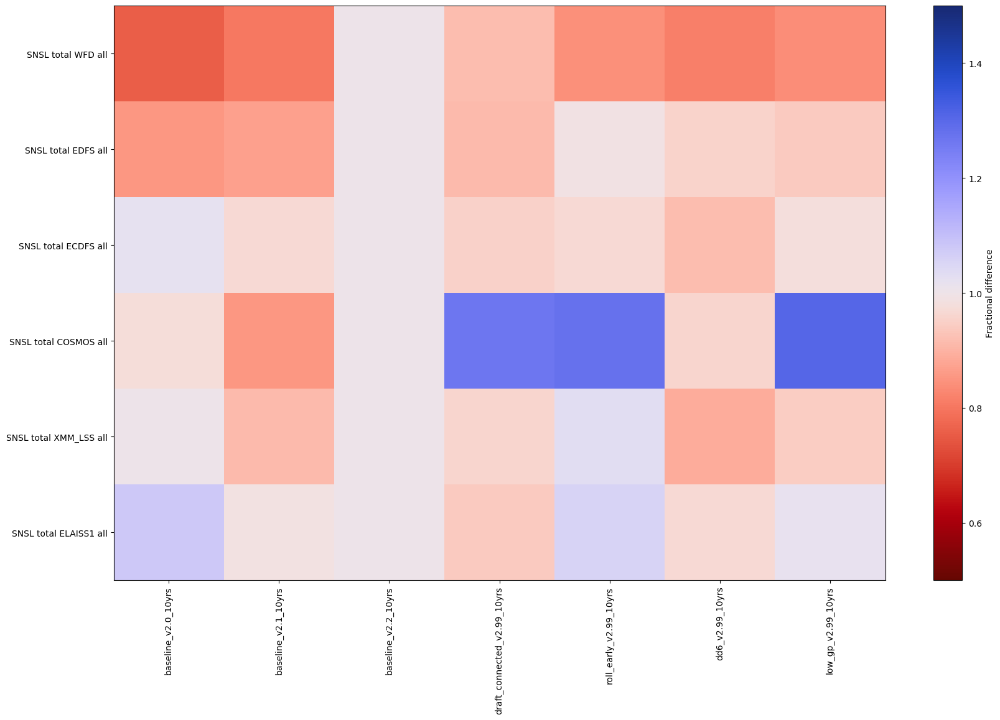

In [28]:
# The strong lensed SN are just very rare, so they show slight changes here but the actual values are likely
# equivalent 
for m in ['SNSL DDF']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)
    

summaries.loc[these_runs, metric_sets.loc['SNSL DDF']['metric']]

In [29]:
summaries.loc[these_runs,
              ['fONv MedianNvis fO  HealpixSlicer', 'fONv MinNvis fO  HealpixSlicer', 
               'fOArea_750 fO All sky HealpixSlicer', 'fOArea fO  HealpixSlicer']]

metric,fONv MedianNvis fO HealpixSlicer,fONv MinNvis fO HealpixSlicer,fOArea_750 fO All sky HealpixSlicer,fOArea fO HealpixSlicer
run,,,,
baseline_v2.0_10yrs,839.0,787.0,18620.568813,12893.228978
baseline_v2.1_10yrs,838.0,784.0,18676.801487,12434.135354
baseline_v2.2_10yrs,830.0,779.0,18627.283162,10569.224874
draft_connected_v2.99_10yrs,792.0,748.0,17912.204976,1953.036312
roll_early_v2.99_10yrs,792.0,750.0,18028.866793,1945.482670
dd6_v2.99_10yrs,810.0,766.0,18816.963526,5309.371600
low_gp_v2.99_10yrs,822.0,667.0,17626.005843,8264.524524
